In [1]:
from vrae.vrae import VRAE
from vrae.utils import *
import time
import shutil
import numpy as np
import torch
import torch.nn as nn   
import pandas as pd
import plotly
from torch.utils.data import DataLoader, TensorDataset
plotly.offline.init_notebook_mode()
from tslearn.preprocessing import TimeSeriesScalerMeanVariance 
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans, DBSCAN
import sklearn.metrics
import matplotlib.pyplot as plt
import seaborn as sns

def last_noNaN_index(serie):
    return((~np.isnan(serie.flatten())).cumsum(0).argmax(0))

def first_NaN_index(serie):
    return(np.where(np.isnan(serie))[0][0] if np.sum(np.isnan(serie))>0 else len(serie))

def my_scaler(data, feature_range = (0,1)): #list of series
    global_min = np.min([np.min(np.log(serie)) for serie in data])
    global_max = np.max([np.max(np.log(serie)) for serie in data])
    data_scaled = []
    for serie in data:
        serie = np.log(serie)
        serie = (serie - global_min) / (global_max - global_min)
        serie = serie * (feature_range[1] - feature_range[0]) + feature_range[0]
        data_scaled.append(serie)
    return(data_scaled)

def encode_sequence_1dim(vrae_model, sequence):
    vrae_model.eval()
    vrae_model.batch_size = 1
    input_seq = torch.from_numpy(sequence).float().unsqueeze(1).unsqueeze(0).unsqueeze(0).cuda()
    latent = vrae_model.transform(input_seq)
    return latent[0,:]

def encode_sequence_2dim(vrae_model, sequence):
    vrae_model.eval()
    vrae_model.batch_size = 1
    input_seq = torch.from_numpy(sequence).float().unsqueeze(0).unsqueeze(0).cuda()
    latent = vrae_model.transform(input_seq)
    return latent[0,:]

def forward_sequence_1dim(vrae_model, sequence):
    if sequence.shape[0]>vrae_model.sequence_length:
        print(f'Sequence not {vrae_model.sequence_length}')
        return(-1)
    vrae_model.eval()
    fake_batch_200 = np.tile(sequence, (200, 1)).T
    fake_batch_200 = torch.from_numpy(fake_batch_200).float().unsqueeze(2).cuda()
    reconstruction = vrae_model.forward(fake_batch_200)
    return reconstruction[0][:,0,:].cpu().detach().numpy()

# df = pd.read_pickle(fr'C:\Users\achfr\OneDrive - University of Edinburgh\Compiled dataset\df_compiled_mothers_labelled_cyclefate.csv')
# df_tracks= df.pivot(values=[
#     'GrowthRateSize','GrowthRateLength','GrowthRateFeretMax','GrowthRateFeretMaxSliding',
#     'InterdivisionTimes','DivisionRate','DivisionRate_filtered','TrackLength','TrackLength_filtered',
#     'Size','SizeAtBirthSize','FeretMax','SizeAtBirthFeretMax','MaxLength','SpineLength','SizeAtBirthLength','SpineWidth',
#     'MeanIntensity_mch','MeanIntensity_gfp','Maxgfp',
#     'BacteriaLineage','NextDivisionFrame','PreviousDivisionFrame',
#     'TrackHeadIndices','Prev','Next','Idx','Frame','Indices','PositionIdx','cellcycle_fate'], 
#     index=['Position','ParentTrackHeadIndices','Medium','Treatment','RepeatID','RepeatDate','fate','DeathSubtype'],
#     columns='Time')

X_train shape	 (63266, 96, 2) 	 X_test shape	 (7030, 96, 2)


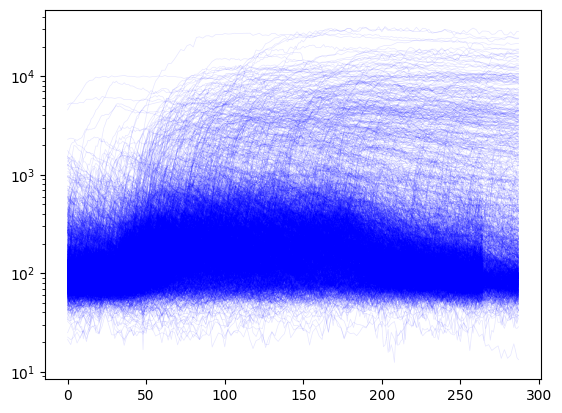

In [2]:
### Creating dataset and splitting it into train and test sets then data augmentation
# liste_x=[]
# liste_y=[]

# dataset_name_list = ['gly_control_1','glu_control_1','gluaa_control_1','gly_cip_1','glu_cip_1','gluaa_cip_1','gly_ciptet_1','glu_ciptet_1','gluaa_ciptet_1']

# for exp_name in dataset_name_list:

#     medium,treatment,replicate = exp_name.split('_')

#     frame = df_tracks.loc(axis=0)[:,:,medium,treatment,replicate]
    
#     size_array = np.array([list(frame['FeretMax'].T[k]) for k in frame['FeretMax'].T.keys()])
#     cyclefate_array = np.array([list(frame['cellcycle_fate'].T[k]) for k in frame['cellcycle_fate'].T.keys()])
#     sos_array = np.array([list(frame['MeanIntensity_gfp'].T[k]) for k in frame['MeanIntensity_gfp'].T.keys()])
#     mcherry_array = np.array([list(frame['MeanIntensity_mch'].T[k]) for k in frame['MeanIntensity_mch'].T.keys()])

#     DeathSubtype = np.array([i for i in frame.reset_index('DeathSubtype')['DeathSubtype']])

#     for i in range(size_array.shape[0]):
#         ##fill nans missing timepoints with the mean of the previous and next timepoints
#         size_serie =  size_array[i]
#         for j in range(1,len(size_serie)-1):
#             if np.isnan(size_serie[j]):
#                 size_serie[j] = np.mean([size_serie[j-1],size_serie[j+1]])

#         sos_serie = sos_array[i]
#         for j in range(1,len(sos_serie)-1):
#             if np.isnan(sos_serie[j]):
#                 sos_serie[j] = np.mean([sos_serie[j-1],sos_serie[j+1]])
                
#         mcherry_serie = mcherry_array[i]
#         for j in range(1,len(mcherry_serie)-1):
#             if np.isnan(mcherry_serie[j]):
#                 mcherry_serie[j] = np.mean([mcherry_serie[j-1],mcherry_serie[j+1]])

#         cyclefate_serie = cyclefate_array[i]
#         for j in range(len(cyclefate_serie)-1):
#             if cyclefate_serie[j] == 'nan':
#                 cyclefate_serie[j] = cyclefate_serie[j+1]

#         t_death = len(cyclefate_serie)
#         if np.where(cyclefate_serie != 'alive')[0].shape[0] > 0:
#             t_death = np.where(cyclefate_serie != 'alive')[0][0]

#         # last_usable_timepoint = np.min([last_noNaN_index(size_serie),last_noNaN_index(sos_serie),last_noNaN_index(mcherry_serie)])
#         first_NaN = np.min([first_NaN_index(size_serie),first_NaN_index(sos_serie),first_NaN_index(mcherry_serie)])

#         if first_NaN>96:
#             last_usable_timepoint = min(first_NaN,288)
#             liste_x.append((size_serie[:last_usable_timepoint],sos_serie[:last_usable_timepoint],mcherry_serie[:last_usable_timepoint]))
#             liste_y.append((medium,treatment,replicate,t_death,DeathSubtype[i]))
# #scan for NANs in all liste_x
# for x in liste_x:
#     for serie in x:
#         if np.sum(np.isnan(serie))>0:
#             print('NAN found')

# np.save(fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_sos\liste_x_SOS_training.npy',np.array(liste_x,dtype=object))
# np.save(fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_sos\liste_y_SOS_training.npy',np.array(liste_y,dtype=object))

liste_x = np.load(fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_sos\liste_x_SOS_training.npy',allow_pickle=True)
liste_y = np.load(fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_sos\liste_y_SOS_training.npy',allow_pickle=True)

liste_x_scaled_SOS = my_scaler([x[1] for x in liste_x], feature_range=(-1,1)) #using only the SOS signal
liste_x_scaled_size = my_scaler([x[0] for x in liste_x], feature_range=(-1,1)) #using only the Size signal
combined_scaled = []
for i in range(len(liste_x_scaled_SOS)):
    combined_scaled.append(np.vstack((liste_x_scaled_size[i], liste_x_scaled_SOS[i])).T)

liste_x_train = []
liste_y_train = []
for i in range(len(combined_scaled)):
    usable_data = combined_scaled[i]
    for j in range(0, len(usable_data) - 96 + 1, 6):
        liste_x_train.append(usable_data[j:j+96,:])
        liste_y_train.append(liste_y[i])

# liste_x_train = [x[:,0,np.newaxis] for x in liste_x_train] #ensure all sequences are 96 timepoints long
X_train, X_test, y_train, y_test = train_test_split(np.array(liste_x_train)[:,:], np.array(liste_y_train), test_size=0.1, random_state=42, shuffle=False)

# save those 4 arrays
# np.save(fr'C:\Users\achfr\timeseries-clustering-vae\test folder\X_train_SOS_size.npy', X_train)
# np.save(fr'C:\Users\achfr\timeseries-clustering-vae\test folder\X_test_SOS_size.npy', X_test)
# np.save(fr'C:\Users\achfr\timeseries-clustering-vae\test folder\y_train_SOS_size.npy', y_train)
# np.save(fr'C:\Users\achfr\timeseries-clustering-vae\test folder\y_test_SOS_size.npy', y_test)



train_dataset = TensorDataset(torch.from_numpy(X_train).to('cuda'))
test_dataset = TensorDataset(torch.from_numpy(X_test))

for s  in  [x[1] for x in liste_x]:
    plt.plot(s,alpha=0.1,color='blue',linewidth=0.5)
plt.yscale('log')

print('X_train shape\t',X_train.shape,'\t X_test shape\t',X_test.shape)

In [3]:
# # ## training cell
# for replicate in [0]:
#     t0 = time.time()

#     sequence_length = X_train.shape[1]

#     number_of_features = 2
#     dload = './model_dir_mm' #download directory
#     hidden_size = 90
#     hidden_layer_depth = 2
#     batch_size = 100
#     learning_rate = 0.0005 # 0.0005
#     n_epochs = 200
#     dropout_rate = 0.2
#     optimizer = 'Adam' # options: ADAM, SGD
#     cuda = True # options: True, False
#     print_every=1000
#     clip = True # options: True, False
#     max_grad_norm=5
#     loss = 'MSELoss' # options: SmoothL1Loss, MSELoss
#     block = 'LSTM' # options: LSTM, GRU


#     for latent_length in range(19,10-1,-1):
#         print('latent_length\t',latent_length,'\t elapsed time\t',(time.time()-t0)/60,' minutes\t',(time.time()-t0)/3600.0,' hours')

#         vrae = VRAE(sequence_length=sequence_length,
#                     number_of_features = number_of_features,
#                     hidden_size = hidden_size, 
#                     hidden_layer_depth = hidden_layer_depth,
#                     latent_length = latent_length,
#                     batch_size = batch_size,
#                     learning_rate = learning_rate,
#                     n_epochs = n_epochs,
#                     dropout_rate = dropout_rate,
#                     optimizer = optimizer, 
#                     cuda = cuda,
#                     print_every=print_every, 
#                     clip=clip, 
#                     max_grad_norm=max_grad_norm,
#                     loss = loss,
#                     block = block,
#                     dload = dload)

#         vrae.fit(train_dataset, test_dataset, save=True)

#         file = open(fr'C:\Users\achfr\timeseries-clustering-vae\model_dir_mm\print.txt').readlines()
#         train_losses = []
#         test_losses = []
#         for line in file:
#             if 'Average loss' in line:
#                 train_losses.append(float(line.split(' ')[-2]))
#                 test_losses.append(float(line.split(' ')[-1][:-2]))
#                 # print(float(line.split(' ')[-2]),float(line.split(' ')[-1][:-2]))

#         shutil.move(fr'C:\Users\achfr\timeseries-clustering-vae\model_dir_mm\model.pth', fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_SOS_size_fat\model_{replicate}_{latent_length}.pth')
#         shutil.move(fr'C:\Users\achfr\timeseries-clustering-vae\model_dir_mm\model_best.pth', fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_SOS_size_fat\model_best_{replicate}_{latent_length}.pth')
#         np.save(fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_SOS_size_fat\train_losses_{replicate}_{latent_length}.npy', train_losses)
#         np.save(fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_SOS_size_fat\test_losses_{replicate}_{latent_length}.npy', test_losses)
#         #388


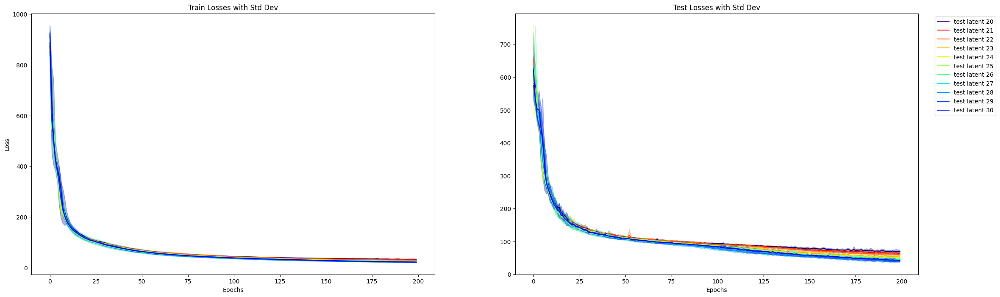

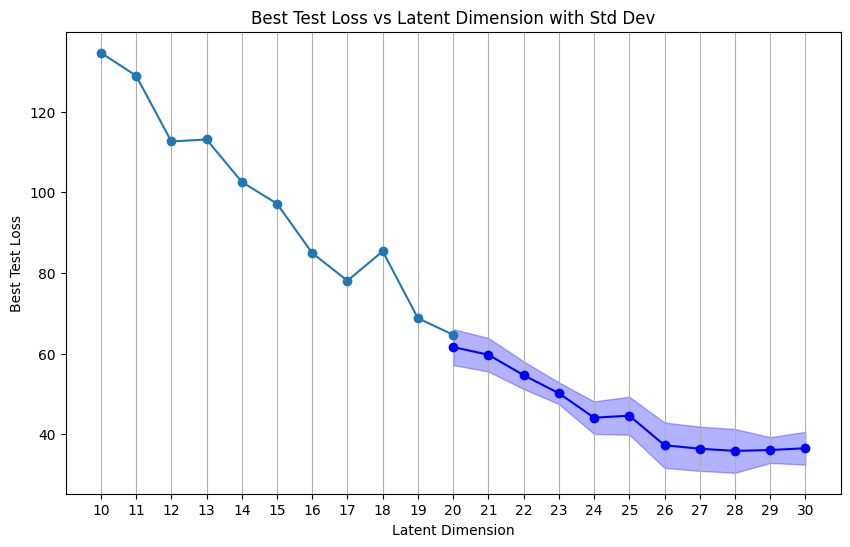

In [3]:
## trainig curves
plot_until_epoch = 200
n_replicate = 6
latent_range = range(20, 31)
path=fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_SOS_size_fat'
loss_dict = {}
for latent_length in latent_range:
    loss_dict[latent_length] = ([],[])
    for replicate in range(n_replicate):
        train_losses = np.load(fr'{path}\train_losses_{replicate}_{latent_length}.npy')
        test_losses = np.load(fr'{path}\test_losses_{replicate}_{latent_length}.npy')
        loss_dict[latent_length][0].append(train_losses)
        loss_dict[latent_length][1].append(test_losses)

# plot mean train loss and mean test loss with std curves+fill as a function of latent dimension using loss_dict 
mean_train_losses = np.zeros((len(latent_range),plot_until_epoch))
mean_test_losses = np.zeros((len(latent_range),plot_until_epoch))
std_train_losses = np.zeros((len(latent_range),plot_until_epoch))
std_test_losses = np.zeros((len(latent_range),plot_until_epoch))

for latent_length in latent_range:
    mean_train_losses[latent_length-latent_range[0]] = np.mean([arr[:plot_until_epoch] for arr in loss_dict[latent_length][0]], axis=0)
    mean_test_losses[latent_length-latent_range[0]] = np.mean([arr[:plot_until_epoch] for arr in loss_dict[latent_length][1]], axis=0)
    std_train_losses[latent_length-latent_range[0]] = np.std([arr[:plot_until_epoch] for arr in loss_dict[latent_length][0]], axis=0)
    std_test_losses[latent_length-latent_range[0]] = np.std([arr[:plot_until_epoch] for arr in loss_dict[latent_length][1]], axis=0)

fig,ax = plt.subplots(1,2,figsize=(27,8))
cmap = plt.get_cmap('jet')
colors = [cmap(x) for x in np.linspace(0, 0.9, len(latent_range))]
for latent_length in latent_range:
    ax[0].plot(mean_train_losses[latent_length-latent_range[0],:plot_until_epoch], label=f'train latent {latent_length}', color=colors[latent_range[0]-latent_length])
    ax[0].fill_between(range(plot_until_epoch), 
                       mean_train_losses[latent_length-latent_range[0],:plot_until_epoch]-std_train_losses[latent_length-latent_range[0],:plot_until_epoch], 
                       mean_train_losses[latent_length-latent_range[0],:plot_until_epoch]+std_train_losses[latent_length-latent_range[0],:plot_until_epoch], 
                       color=colors[latent_range[0]-latent_length], alpha=0.3)
    ax[1].plot(mean_test_losses[latent_length-latent_range[0],:plot_until_epoch], label=f'test latent {latent_length}', color=colors[latent_range[0]-latent_length])
    ax[1].fill_between(range(plot_until_epoch), 
                       mean_test_losses[latent_length-latent_range[0],:plot_until_epoch]-std_test_losses[latent_length-latent_range[0],:plot_until_epoch], 
                       mean_test_losses[latent_length-latent_range[0],:plot_until_epoch]+std_test_losses[latent_length-latent_range[0],:plot_until_epoch], 
                       color=colors[latent_range[0]-latent_length], alpha=0.3)
    ax[0].set_title('Train Losses with Std Dev')
    ax[1].set_title('Test Losses with Std Dev')
    ax[0].set_xlabel('Epochs')
    ax[1].set_xlabel('Epochs')
    ax[0].set_ylabel('Loss')
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))

# plot best test loss with std curves+fill as a function of latent dimension
std_test_losses = []
best_test_loss = []
for latent_length in latent_range:
    test_losses = [arr[:plot_until_epoch] for arr in loss_dict[latent_length][1]]
    best_losses = np.min(np.array(test_losses)[:,-1])
    std_loss = np.std(np.array(test_losses)[:,-1])
    best_test_loss.append(best_losses)
    std_test_losses.append(std_loss)
plt.figure(figsize=(10,6))
plt.plot(latent_range, best_test_loss, marker='o', label='Best Test Loss', color='blue')
plt.fill_between(latent_range, 
                 np.array(best_test_loss)-np.array(std_test_losses), 
                 np.array(best_test_loss)+np.array(std_test_losses), 
                 color='blue', alpha=0.3, label='Std Dev')
best_test_loss_10_20 = [134.589, 128.889, 112.592, 113.08, 102.565, 97.15, 84.922, 78.071, 85.375, 68.775, 64.659]
plt.plot(range(10, 21), best_test_loss_10_20, marker='o')
plt.xticks(range(10, 31))
plt.title('Best Test Loss vs Latent Dimension with Std Dev')
plt.xlabel('Latent Dimension')
plt.ylabel('Best Test Loss')
plt.grid(axis='x')

# best_replicate_26 = np.argmin([arr[-1] for arr in loss_dict[26][1]]) #2

c:\Users\achfr\.conda\envs\mlp\lib\site-packages\torch\nn\_reduction.py:42: UserWarning:

size_average and reduce args will be deprecated, please use reduction='sum' instead.



torch.Size([96, 100, 2])
90
(96, 2)


Text(0.5, 0, 'Timepoints')

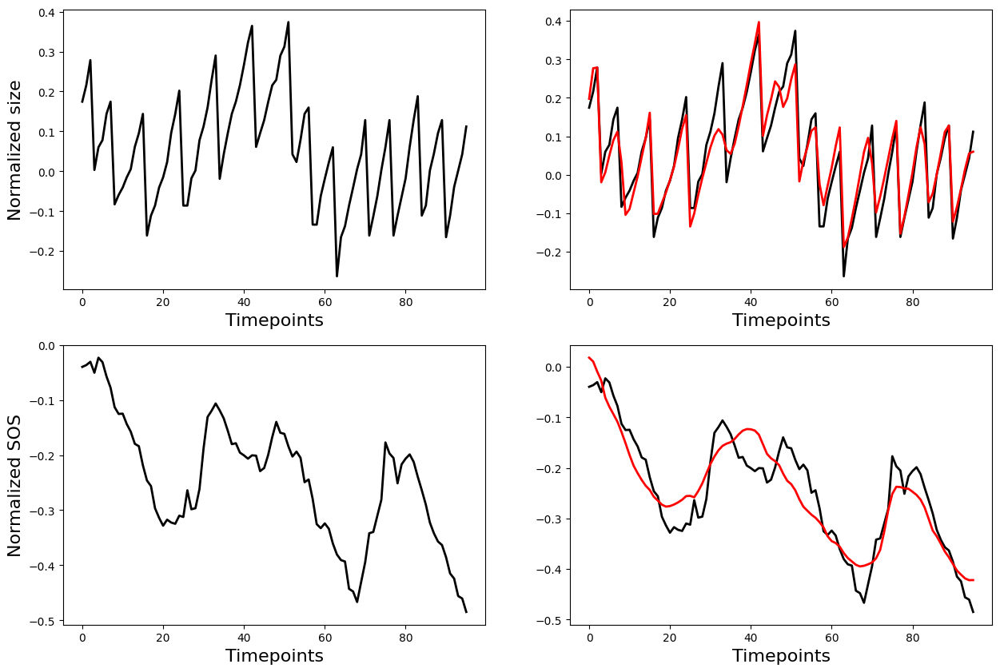

In [4]:
## load model 26 2
sequence_length = X_train.shape[1]
number_of_features = X_train.shape[2]
latent_length = 26
best_replicate = 2

dload = './model_dir_mm' #download directory
hidden_size = 90
hidden_layer_depth = 2
batch_size = 100
learning_rate = 0.0005 # 0.0005
n_epochs = 200
dropout_rate = 0.2
optimizer = 'Adam' # options: ADAM, SGD
cuda = True # options: True, False
print_every=1000
clip = True # options: True, False
max_grad_norm=5
loss = 'MSELoss' # options: SmoothL1Loss, MSELoss
block = 'LSTM' # options: LSTM, GRU

vrae_trained = VRAE(sequence_length=sequence_length,
        number_of_features = number_of_features,
        hidden_size = hidden_size, 
        hidden_layer_depth = hidden_layer_depth,
        latent_length = latent_length,
        batch_size = batch_size,
        learning_rate = learning_rate,
        n_epochs = n_epochs,
        dropout_rate = dropout_rate,
        optimizer = optimizer, 
        cuda = cuda,
        print_every=print_every, 
        clip=clip, 
        max_grad_norm=max_grad_norm,
        loss = loss,
        block = block,
        dload = dload)

vrae_trained.load(fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_SOS_size_fat\model_best_{best_replicate}_{latent_length}.pth')


vrae_trained.eval()
p=3
testseq2 = test_dataset[batch_size*p:batch_size*(p+1)][0].float().permute(1, 0, 2).cuda()
print(testseq2.shape)

outp = vrae_trained.forward(testseq2)

k=np.random.randint(0,batch_size)
print(k)
# k=174
input_seq = testseq2[:,k,:].cpu().detach().numpy()
output_seq = outp[0][:,k,:].cpu().detach().numpy()

fig,ax =  plt.subplots(2,2,figsize=(15,10))
print(input_seq.shape)

ax[0,0].plot(input_seq[:,0], color ='black',linewidth = 2, label='input')
ax[0,1].plot(input_seq[:,0], color ='black',linewidth = 2, label='input')
ax[0,1].plot(output_seq[:,0], color='red',linewidth = 2, label='reconstruction')
ax[0,0].set_xlabel('Timepoints', fontsize=16)
ax[0,0].set_ylabel('Normalized size', fontsize=16)
ax[0,1].set_xlabel('Timepoints', fontsize=16)

ax[1,0].plot(input_seq[:,1], color ='black',linewidth = 2, label='input')
ax[1,1].plot(input_seq[:,1], color ='black',linewidth = 2, label='input')
ax[1,1].plot(output_seq[:,1], color='red',linewidth = 2, label='reconstruction')
ax[1,0].set_xlabel('Timepoints', fontsize=16)
ax[1,0].set_ylabel('Normalized SOS', fontsize=16)
ax[1,1].set_xlabel('Timepoints', fontsize=16)

In [5]:
#### import literally everything
# dataset_name_list = ['gly_control_1','glu_control_1','gluaa_control_1','gly_cip_1','glu_cip_1','gluaa_cip_1','gly_ciptet_1','glu_ciptet_1','gluaa_ciptet_1'] training set
dataset_name_list = ['gly_control_1', 'gly_control_2', 'gly_control_3', 'gly_cip_1', 'gly_cip_2', 'gly_tet_1', 'gly_tet_2', 'gly_tet_3', 'gly_ciptet_1', 'gly_ciptet_2', 'glu_control_1', 'glu_control_2', 'glu_cip_1', 'glu_cip_2', 
 'glu_tet_1', 'glu_tet_2', 'glu_ciptet_1', 'glu_ciptet_2', 'gluaa_control_1', 'gluaa_control_2', 'gluaa_cip_1', 'gluaa_cip_2', 'gluaa_cip_3', 'gluaa_tet_1', 'gluaa_tet_2', 'gluaa_ciptet_1', 'gluaa_ciptet_2']


# all_data_x=[]
# all_data_y=[]

# for exp_name in dataset_name_list:

#     medium,treatment,replicate = exp_name.split('_')

#     frame = df_tracks.loc(axis=0)[:,:,medium,treatment,replicate]
    
#     size_array = np.array([list(frame['FeretMax'].T[k]) for k in frame['FeretMax'].T.keys()])
#     cyclefate_array = np.array([list(frame['cellcycle_fate'].T[k]) for k in frame['cellcycle_fate'].T.keys()])
#     sos_array = np.array([list(frame['MeanIntensity_gfp'].T[k]) for k in frame['MeanIntensity_gfp'].T.keys()])
#     mcherry_array = np.array([list(frame['MeanIntensity_mch'].T[k]) for k in frame['MeanIntensity_mch'].T.keys()])

#     DeathSubtypes = np.array([i for i in frame.reset_index('DeathSubtype')['DeathSubtype']])
#     Fates = np.array([i for i in frame.reset_index('fate')['fate']])

#     for i in range(size_array.shape[0]):
#         ##fill nans missing timepoints with the mean of the previous and next timepoints
#         size_serie =  size_array[i]
#         for j in range(1,len(size_serie)-1):
#             if np.isnan(size_serie[j]):
#                 size_serie[j] = np.mean([size_serie[j-1],size_serie[j+1]])

#         sos_serie = sos_array[i]
#         for j in range(1,len(sos_serie)-1):
#             if np.isnan(sos_serie[j]):
#                 sos_serie[j] = np.mean([sos_serie[j-1],sos_serie[j+1]])
                
#         mcherry_serie = mcherry_array[i]
#         for j in range(1,len(mcherry_serie)-1):
#             if np.isnan(mcherry_serie[j]):
#                 mcherry_serie[j] = np.mean([mcherry_serie[j-1],mcherry_serie[j+1]])

#         cyclefate_serie = cyclefate_array[i]
#         for j in range(len(cyclefate_serie)-1):
#             if cyclefate_serie[j] == 'nan':
#                 cyclefate_serie[j] = cyclefate_serie[j+1]

#         t_death = len(cyclefate_serie)
#         if np.where(cyclefate_serie != 'alive')[0].shape[0] > 0:
#             t_death = np.where(cyclefate_serie != 'alive')[0][0]

#         # last_usable_timepoint = np.min([last_noNaN_index(size_serie),last_noNaN_index(sos_serie),last_noNaN_index(mcherry_serie)])
#         first_NaN = np.min([first_NaN_index(size_serie),first_NaN_index(sos_serie),first_NaN_index(mcherry_serie)])

#         if first_NaN>96:
#             last_usable_timepoint = min(first_NaN,288)
#             all_data_x.append((size_serie[:last_usable_timepoint],sos_serie[:last_usable_timepoint],mcherry_serie[:last_usable_timepoint]))
#             all_data_y.append((medium,treatment,replicate,t_death,DeathSubtypes[i],Fates[i]))
# #scan for NANs in all all_data_x
# for x in all_data_x:
#     for serie in x:
#         if np.sum(np.isnan(serie))>0:
#             print('NAN found')

# np.save(fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_sos\all_data_x_SOS.npy',np.array(all_data_x,dtype=object))
# np.save(fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_sos\all_data_y_SOS.npy',np.array(all_data_y,dtype=object))
## 1m48

all_data_x = np.load(fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_sos\all_data_x_SOS.npy',allow_pickle=True)
all_data_y = np.load(fr'C:\Users\achfr\timeseries-clustering-vae\latent_result_sos\all_data_y_SOS.npy',allow_pickle=True)

index_to_remove =[6,7,8,9,10,18,43,44,45,46,47,2974,2975,2976,3135,3136,3137,3138,3139,3140,3141,3142,3143,3144,3145,5415,5538,5710,5711,5712,5713,5714,5715,5716] #after manual inspection
all_data_x = np.delete(all_data_x, index_to_remove, axis=0)
all_data_y = np.delete(all_data_y, index_to_remove, axis=0)

all_x_scaled_SOS = my_scaler([x[1] for x in all_data_x], feature_range=(-1,1)) #using only the SOS signal
all_x_scaled_size = my_scaler([x[0] for x in all_data_x], feature_range=(-1,1)) #using only the Size signal
data_myscaled = []
for i in range(len(all_x_scaled_SOS)):
    data_myscaled.append(np.vstack((all_x_scaled_size[i], all_x_scaled_SOS[i])).T)

print(len(data_myscaled),' total sequences imported',data_myscaled[0].shape,' shape of first sequence')
print(all_data_y[0],' example of label tuple (medium,treatment,replicate,t_death,DeathSubtype,Fate)')

8087  total sequences imported (288, 2)  shape of first sequence
['gly' 'control' '1' 569 '2058435' 'survived']  example of label tuple (medium,treatment,replicate,t_death,DeathSubtype,Fate)


In [6]:
# encode all sequences
latent_all_trunc = []
all_data_y_trunc = []
series_trunc = []

vrae_trained.batch_size = 1
for i in range(len(data_myscaled)):
    if data_myscaled[i].shape[0]>=264: #cutting to 264 timepoints (22h) to have all sequences of same length
        latent = encode_sequence_2dim(vrae_trained, data_myscaled[i][:264,:])
        latent_all_trunc.append(latent)
        all_data_y_trunc.append(all_data_y[i])
        series_trunc.append(data_myscaled[i][:264,:])

print(len(data_myscaled))
print('Total dataset size\t',len(all_data_y_trunc))
latent_all_trunc = np.array(latent_all_trunc)
all_data_y_trunc = np.array(all_data_y_trunc)

8087
Total dataset size	 7089


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Explained variance by PC1 and PC2:	 0.30910778 0.09327185 	 Total:	 0.40237963


Text(0, 0.5, 'Variance Explained (%)')

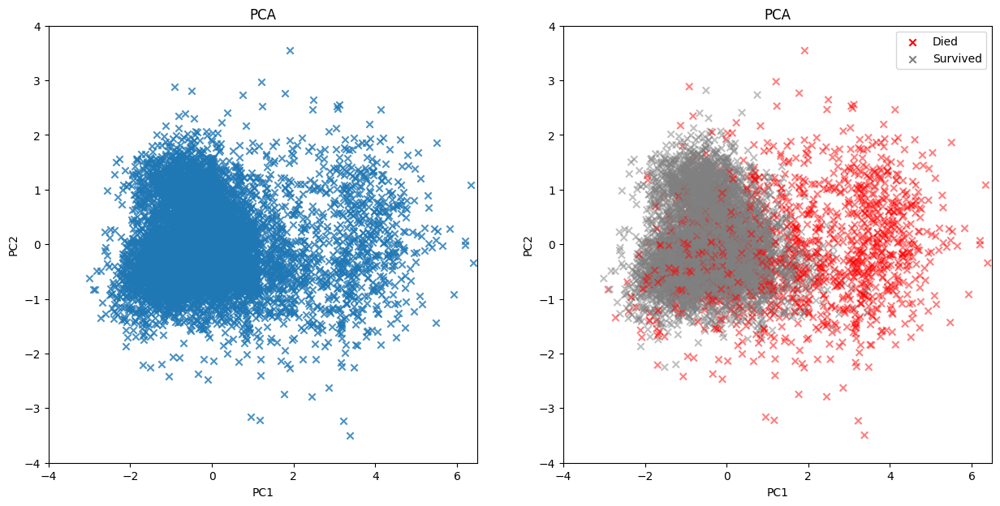

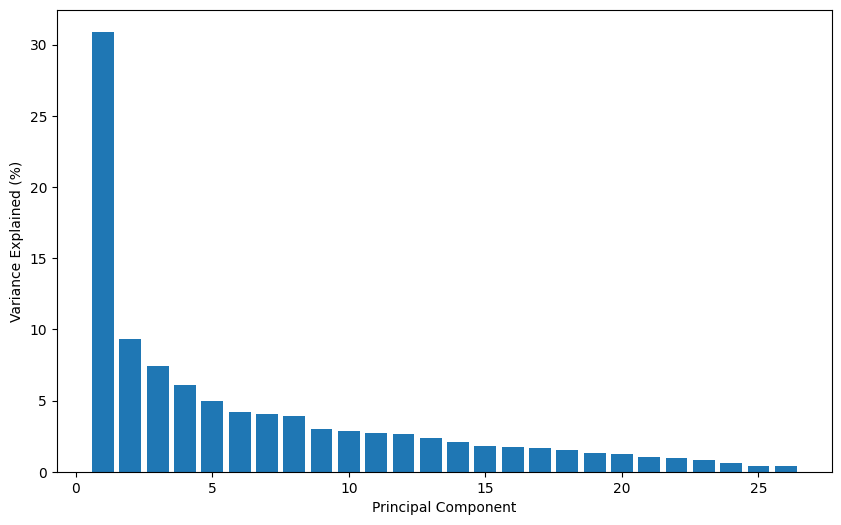

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# whole data pca

z_run = latent_all_trunc
z_run_pca_fit = PCA(n_components=z_run.shape[1]).fit(z_run)
z_run_pca = z_run_pca_fit.transform(z_run)
# z_run_tsne = TSNE(perplexity=50, min_grad_norm=1E-12, n_iter=300, learning_rate='auto', init='random').fit_transform(z_run)

use_xylims = True
xlims = (-4,6.5)
ylims = (-4,4)

fig, ax = plt.subplots(1, 2, figsize=(15, 7))
ax[0].scatter(z_run_pca[:, 0], z_run_pca[:, 1], marker='x',alpha=0.8)
# ax[0].legend()
ax[0].set_title('PCA')
ax[0].set_xlabel('PC1')
ax[0].set_ylabel('PC2')
if use_xylims:
    ax[0].set_ylim(ylims[0],ylims[1])
    ax[0].set_xlim(xlims[0],xlims[1])


hex_colors =  {0:'red', 1:'grey'}
colors[latent_range[0]-latent_length] = [hex_colors[y[-1]=='survived'] for y in all_data_y_trunc]

ax[1].scatter(z_run_pca[:, 0], z_run_pca[:, 1], color=colors[latent_range[0]-latent_length], marker='x',alpha=0.5)
ax[1].legend()
ax[1].set_title('PCA')
ax[1].set_xlabel('PC1')
ax[1].set_ylabel('PC2')
if use_xylims:
    ax[1].set_ylim(ylims[0],ylims[1])
    ax[1].set_xlim(xlims[0],xlims[1])
ax[1].scatter(-100,-100, color='red', label='Died', marker='x')
ax[1].scatter(-100,-100, color='grey', label='Survived', marker='x')
ax[1].legend()
# pcs variance explained
explained_variance = z_run_pca_fit.explained_variance_ratio_
print('Explained variance by PC1 and PC2:\t',explained_variance[0],explained_variance[1],'\t Total:\t',explained_variance[0]+explained_variance[1]) 
# pcs variance explained graph
plt.figure(figsize=(10,6))
plt.bar(range(1, len(explained_variance) + 1), explained_variance * 100)
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained (%)')

In [8]:
# lazy fate
from lazypredict.Supervised import LazyClassifier
# avant sklearn  1.1.2

latent_all_cip = np.array([latent_all_trunc[i] for i,y in enumerate(all_data_y_trunc) if (y[1][:3]=='cip')])
y_cip = np.array([0 if y[-1]=='survived' else 1 for y in all_data_y_trunc if (y[1][:3]=='cip')])
X_fate = latent_all_cip
Y_fate = y_cip

X_train_fate, X_test_fate, y_train_fate, y_test_fate = train_test_split(X_fate, Y_fate, test_size=0.2, random_state=42, shuffle=True)
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = clf.fit(X_train_fate, X_test_fate, y_train_fate, y_test_fate)
print(models)

  0%|          | 0/29 [00:00<?, ?it/s]

[LightGBM] [Info] Number of positive: 833, number of negative: 1729
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000484 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6630
[LightGBM] [Info] Number of data points in the train set: 2562, number of used features: 26
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.325137 -> initscore=-0.730265
[LightGBM] [Info] Start training from score -0.730265
                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
QuadraticDiscriminantAnalysis      0.95               0.93     0.93      0.95   
XGBClassifier                      0.93               0.91     0.91      0.93   
SVC                                0.93               0.91     0.91      0.93   
LGBMClassifier                     0.93               0.90     0.90      0.93   
KNeighborsClassifier    

MLP (AUC = 0.9661457661529806 ± 0.008399557504487117)
NB (AUC = 0.8980724932027148 ± 0.005368818404543105)
RF (AUC = 0.9565608883358987 ± 0.008304180668373256)
LR (AUC = 0.9045572965059293 ± 0.007376901833505154)
KNN (AUC = 0.9419310140957707 ± 0.010529933994565272)


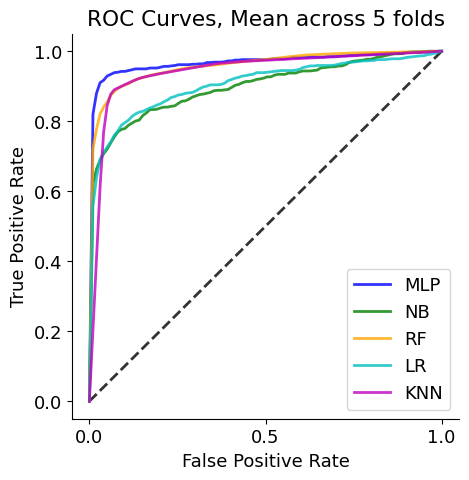

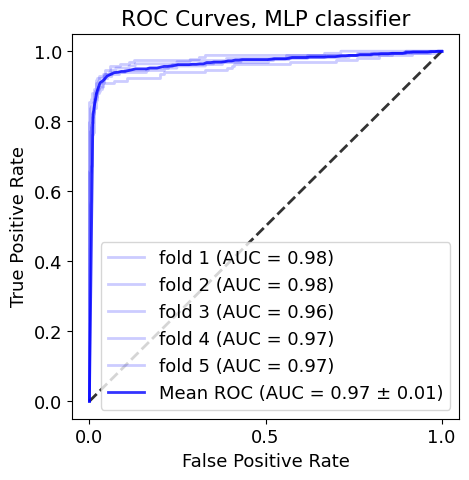

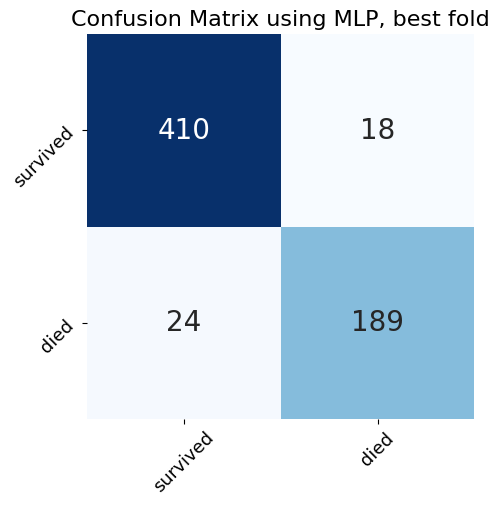

In [156]:
# classif death
import sklearn.metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_curve, auc
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
import seaborn as sns

cv = StratifiedKFold(n_splits=5)
mean_fpr = np.linspace(0, 1, 100)
plt.figure(figsize=(5, 5))
plt.rcParams.update({'font.size': 13})
# Plot the random chance line
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black', alpha=0.8)


classifiers = [MLPClassifier(hidden_layer_sizes = np.array([40,20]), max_iter=2000, random_state=42),
               GaussianNB(),
               RandomForestClassifier(random_state = 42, class_weight="balanced", criterion = 'gini', max_depth = None, n_estimators = 50), 
               LogisticRegression(random_state = 42, class_weight="balanced", max_iter=1000),
               KNeighborsClassifier(n_neighbors=3)]
colors[latent_range[0]-latent_length] = ['b', 'g', 'orange', 'c', 'm', 'y']
names = ['MLP', 'Naive Bayes', 'Random Forest', 'Logistic Regression', 'KNN']
names = ['MLP', 'NB', 'RF', 'LR', 'KNN']

for clf, color,name in zip(classifiers, colors[latent_range[0]-latent_length], names):
    tprs = []
    aucs = []
    for i, (train, test) in enumerate(cv.split(X_train_fate, y_train_fate)):
        X_train_fate_cv = X_train_fate[train]
        X_test_fate_cv = X_train_fate[test]
        # Train the classifier
        clf.fit(X_train_fate_cv, y_train_fate[train])
        probas_ = clf.predict_proba(X_test_fate_cv)
        # Compute ROC curve and area under the curve
        fpr, tpr, thresholds = roc_curve(y_train_fate[test], probas_[:, 1])
        tprs.append(np.interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    plt.plot(mean_fpr, mean_tpr, color=color, label=f'{name}', lw=2, alpha=0.8)
    print(f'{name} (AUC = {mean_auc} ± {std_auc})')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves, Mean across 5 folds')
plt.legend(loc='lower right')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.figure(figsize=(5, 5))
plt.title('ROC Curves for each fold, MLP Classifier')
plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='black', alpha=0.8)
clf = classifiers[0]
color = 'b'
best_auc = 0
best_classifier = None
tprs = []
aucs = []
for i, (train, test) in enumerate(cv.split(X_train_fate, y_train_fate)):
    X_train_fate_cv = X_train_fate[train]
    X_test_fate_cv = X_train_fate[test]
    # Train the classifier
    clf.fit(X_train_fate_cv, y_train_fate[train])
    # Predict probabilities
    probas_ = clf.predict_proba(X_test_fate_cv)
    # Compute ROC curve and area under the curve
    fpr, tpr, thresholds = roc_curve(y_train_fate[test], probas_[:, 1])
    tprs.append(np.interp(mean_fpr, fpr, tpr))
    tprs[-1][0] = 0.0
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, alpha=0.2,color=color,label=f'fold {i+1} (AUC = {roc_auc:.2f})') # 

    if roc_auc > best_auc:
        best_auc = roc_auc
        best_classifier = clf
# Plot the mean ROC curve
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)
plt.plot(mean_fpr, mean_tpr, color=color, label=f'Mean ROC (AUC = {mean_auc:.2f} ± {std_auc:.2f})', lw=2, alpha=0.8)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves, MLP classifier')
plt.legend(loc='lower right')

fig,ax = plt.subplots(1,1,figsize=(5, 5))
plt.rcParams.update({'font.size': 20})
clf = best_classifier
y_pred = clf.predict(X_test_fate)
# print('Accuracy:', accuracy_score(y_test_fate, y_pred))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_fate, y_pred)
# confusion_matrix = confusion_matrix/np.sum(confusion_matrix)*100
sns.heatmap(confusion_matrix, annot=True, xticklabels=False, yticklabels=False, cbar=False, ax=ax, cmap="Blues",fmt='g')
plt.title('Confusion Matrix using MLP, best fold', fontsize=16)
plt.xticks([0.5,1.5],['survived','died'],rotation=45)
plt.yticks([0.5,1.5],['survived','died'],rotation=45)
lab=0


Cip survivors latent shape	 (2157, 26)


Text(0, 0.5, 'tSNE2')

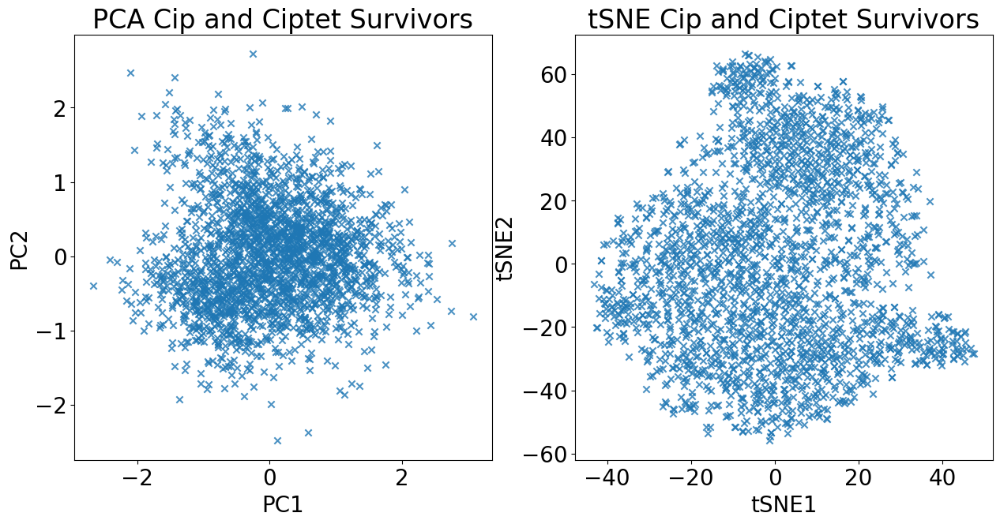

In [157]:
latent_cip_survivors = np.array([latent_all_trunc[i] for i,y in enumerate(all_data_y_trunc) if (y[1][:3]=='cip' and y[-1]=='survived')])
y_cip_survivors = np.array([y for y in all_data_y_trunc if (y[1][:3]=='cip' and y[-1]=='survived')])
series_survivors = [series_trunc[i] for i,y in enumerate(all_data_y_trunc) if (y[1][:3]=='cip' and y[-1]=='survived')]

print('Cip survivors latent shape\t',latent_cip_survivors.shape)

z_run_pca = PCA(n_components=2).fit_transform(latent_cip_survivors)
z_run_tsne = TSNE(perplexity=37, min_grad_norm=1E-12, n_iter=3000, learning_rate='auto', init='random').fit_transform(latent_cip_survivors)
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
ax[0].scatter(z_run_pca[:, 0], z_run_pca[:, 1], marker='x',alpha=0.8)
# ax[0].legend()
ax[0].set_title('PCA Cip and Ciptet Survivors')
ax[0].set_xlabel('PC1')
ax[0].set_ylabel('PC2')
ax[1].scatter(z_run_tsne[:, 0], z_run_tsne[:, 1], marker='x',alpha=0.8)
# ax[1].legend()
ax[1].set_title('tSNE Cip and Ciptet Survivors')
ax[1].set_xlabel('tSNE1')
ax[1].set_ylabel('tSNE2')

In [13]:
# perplexity grid
# perplexities = range(5,100,4)
# fig, ax = plt.subplots(5, 5, figsize=(30, 30))
# ax = ax.flatten()
# for i, perplexity in enumerate(perplexities):
#     print('Computing t-SNE with perplexity\t',perplexity)
#     z_run_tsne = TSNE(perplexity=perplexity, min_grad_norm=1E-12, n_iter=3000, learning_rate='auto', init='random').fit_transform(latent_cip_survivors)
#     ax[i].scatter(z_run_tsne[:, 0], z_run_tsne[:, 1], marker='x',alpha=0.8)
#     ax[i].set_title(f't-SNE with Perplexity {perplexity}', fontsize=16)
#7m30

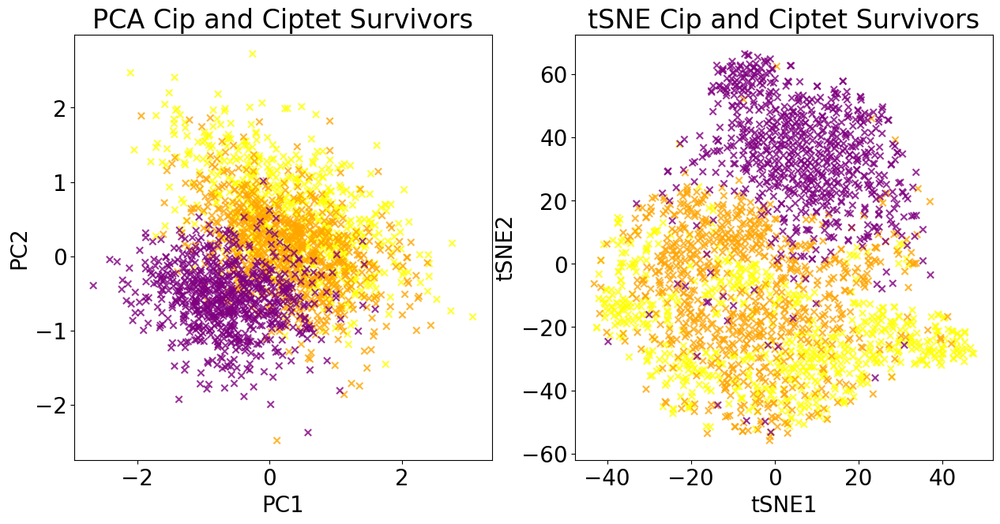

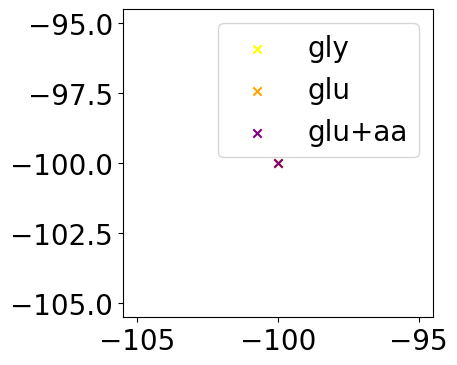

In [158]:
hex_colors =  {'gly':'yellow', 'glu':'orange', 'gluaa':'purple'}
colors = [hex_colors[y[0]] for y in y_cip_survivors]

fig, ax = plt.subplots(1, 2, figsize=(15, 7))
ax[0].scatter(z_run_pca[:, 0], z_run_pca[:, 1], marker='x',alpha=0.8, c=colors)
# ax[0].legend()
ax[0].set_title('PCA Cip and Ciptet Survivors')
ax[0].set_xlabel('PC1')
ax[0].set_ylabel('PC2')
ax[1].scatter(z_run_tsne[:, 0], z_run_tsne[:, 1], marker='x',alpha=0.8, c=colors)
# ax[1].legend()
ax[1].set_title('tSNE Cip and Ciptet Survivors')
ax[1].set_xlabel('tSNE1')
ax[1].set_ylabel('tSNE2')
plt.figure(figsize=(4,4))
plt.scatter(-100,-100, color='yellow', label='gly', marker='x')
plt.scatter(-100,-100, color='orange', label='glu', marker='x')
plt.scatter(-100,-100, color='purple', label='glu+aa', marker='x')
plt.legend()

gly Cip survivors latent shape	 (680, 26)
glu Cip survivors latent shape	 (760, 26)
gluaa Cip survivors latent shape	 (717, 26)


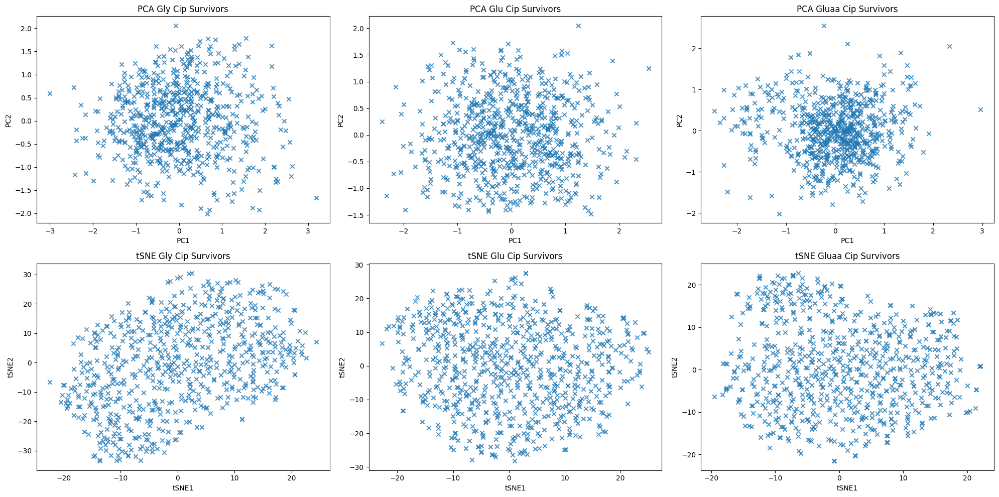

In [10]:
latent_gly_cip_survivors = np.array([latent_all_trunc[i] for i,y in enumerate(all_data_y_trunc) if (y[1][:3]=='cip' and y[-1]=='survived' and y[0]=='gly')])
y_gly_cip_survivors = np.array([y for y in all_data_y_trunc if (y[1][:3]=='cip' and y[-1]=='survived' and y[0]=='gly')])
series_gly_cip_survivors = [series_trunc[i] for i,y in enumerate(all_data_y_trunc) if (y[1][:3]=='cip' and y[-1]=='survived' and y[0]=='gly')]
print('gly Cip survivors latent shape\t',latent_gly_cip_survivors.shape)

latent_glu_cip_survivors = np.array([latent_all_trunc[i] for i,y in enumerate(all_data_y_trunc) if (y[1][:3]=='cip' and y[-1]=='survived' and y[0]=='glu')])
y_glu_cip_survivors = np.array([y for y in all_data_y_trunc if (y[1][:3]=='cip' and y[-1]=='survived' and y[0]=='glu')])
series_glu_cip_survivors = [series_trunc[i] for i,y in enumerate(all_data_y_trunc) if (y[1][:3]=='cip' and y[-1]=='survived' and y[0]=='glu')]
print('glu Cip survivors latent shape\t',latent_glu_cip_survivors.shape)

latent_gluaa_cip_survivors = np.array([latent_all_trunc[i] for i,y in enumerate(all_data_y_trunc) if (y[1][:3]=='cip' and y[-1]=='survived' and y[0]=='gluaa')])
y_gluaa_cip_survivors = np.array([y for y in all_data_y_trunc if (y[1][:3]=='cip' and y[-1]=='survived' and y[0]=='gluaa')])
series_gluaa_cip_survivors = [series_trunc[i] for i,y in enumerate(all_data_y_trunc) if (y[1][:3]=='cip' and y[-1]=='survived' and y[0]=='gluaa')]
print('gluaa Cip survivors latent shape\t',latent_gluaa_cip_survivors.shape)



z_run_pcas = [PCA(n_components=2).fit_transform(latent) for latent in [latent_gly_cip_survivors, latent_glu_cip_survivors, latent_gluaa_cip_survivors]]
z_run_tsnes = [TSNE(perplexity=37, min_grad_norm=1E-12, n_iter=3000, learning_rate='auto', init='random').fit_transform(latent) for latent in [latent_gly_cip_survivors, latent_glu_cip_survivors, latent_gluaa_cip_survivors]]
fig, ax = plt.subplots(2, 3, figsize=(20, 10))
ax[0, 0].scatter(z_run_pcas[0][:, 0], z_run_pcas[0][:, 1], marker='x', alpha=0.8)
ax[0, 0].set_title('PCA Gly Cip Survivors')
ax[0, 0].set_xlabel('PC1')
ax[0, 0].set_ylabel('PC2')
ax[1, 0].scatter(z_run_tsnes[0][:, 0], z_run_tsnes[0][:, 1], marker='x', alpha=0.8)
ax[1, 0].set_title('tSNE Gly Cip Survivors')
ax[1, 0].set_xlabel('tSNE1')
ax[1, 0].set_ylabel('tSNE2')
ax[0, 1].scatter(z_run_pcas[1][:, 0], z_run_pcas[1][:, 1], marker='x', alpha=0.8)
ax[0, 1].set_title('PCA Glu Cip Survivors')
ax[0, 1].set_xlabel('PC1')
ax[0, 1].set_ylabel('PC2')
ax[1, 1].scatter(z_run_tsnes[1][:, 0], z_run_tsnes[1][:, 1], marker='x', alpha=0.8)
ax[1, 1].set_title('tSNE Glu Cip Survivors')
ax[1, 1].set_xlabel('tSNE1')
ax[1, 1].set_ylabel('tSNE2')
ax[0, 2].scatter(z_run_pcas[2][:, 0], z_run_pcas[2][:, 1], marker='x', alpha=0.8)
ax[0, 2].set_title('PCA Gluaa Cip Survivors')
ax[0, 2].set_xlabel('PC1')
ax[0, 2].set_ylabel('PC2')
ax[1, 2].scatter(z_run_tsnes[2][:, 0], z_run_tsnes[2][:, 1], marker='x', alpha=0.8)
ax[1, 2].set_title('tSNE Gluaa Cip Survivors')
ax[1, 2].set_xlabel('tSNE1')
ax[1, 2].set_ylabel('tSNE2')
plt.tight_layout()

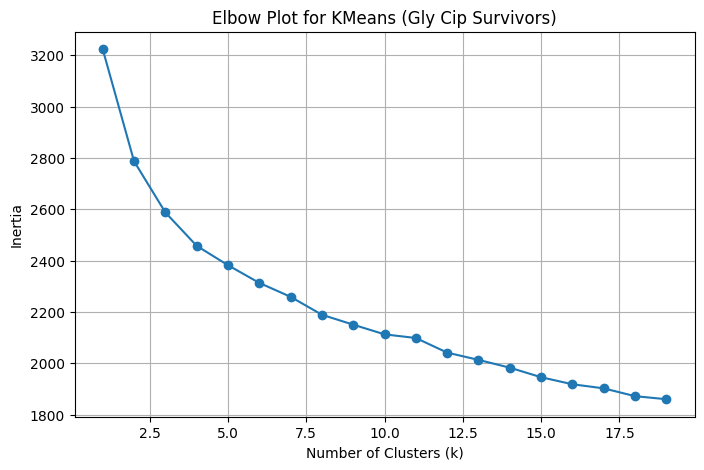

<Figure size 640x480 with 0 Axes>

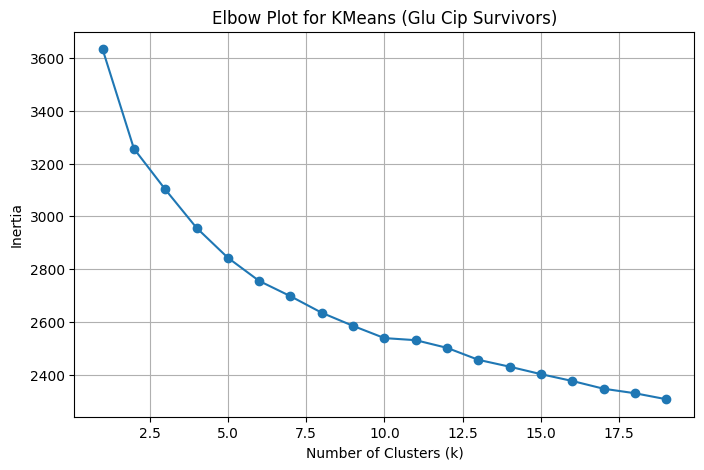

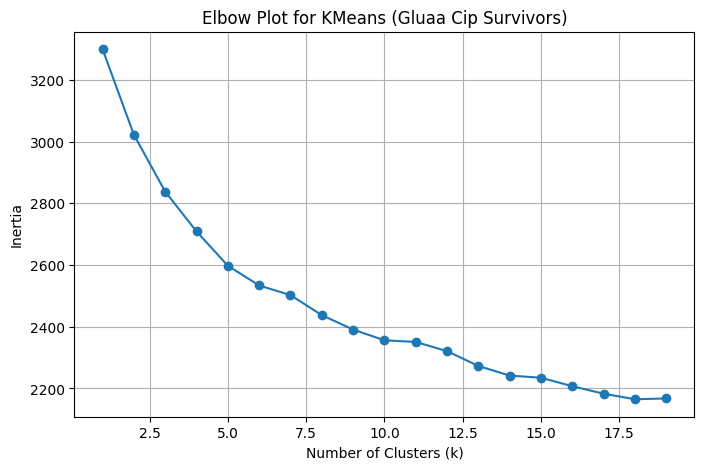

In [11]:
# Elbow plot for KMeans on gly Cip survivors
inertia_values = []
k_values = range(1, 20)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(latent_gly_cip_survivors)
    inertia_values.append(kmeans.inertia_)
plt.figure(figsize=(8, 5))
plt.plot(k_values, inertia_values, marker='o')
plt.title('Elbow Plot for KMeans (Gly Cip Survivors)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
# plt.xticks(k_values)
plt.grid()
plt.show()
plt.tight_layout()
# Elbow plot for KMeans on glu Cip survivors
inertia_values = []
k_values = range(1, 20)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(latent_glu_cip_survivors)
    inertia_values.append(kmeans.inertia_)
plt.figure(figsize=(8, 5))
plt.plot(k_values, inertia_values, marker='o')
plt.title('Elbow Plot for KMeans (Glu Cip Survivors)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
# plt.xticks(k_values)
plt.grid()
plt.show()
# Elbow plot for KMeans on gluaa Cip survivors
inertia_values = []
k_values = range(1, 20)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(latent_gluaa_cip_survivors)
    inertia_values.append(kmeans.inertia_)
plt.figure(figsize=(8, 5))
plt.plot(k_values, inertia_values, marker='o')
plt.title('Elbow Plot for KMeans (Gluaa Cip Survivors)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
# plt.xticks(k_values)
plt.grid()
plt.show()

In [12]:
# gluaa 3 clusters
# kmeans_gluaa = KMeans(n_clusters=3, random_state=42)
# clusters_gluaa = kmeans_gluaa.fit_predict(latent_gluaa_cip_survivors)
# # pca and tsne
# z_run_pca_gluaa = PCA(n_components=2).fit_transform(latent_gluaa_cip_survivors)
# z_run_tsne_gluaa = TSNE(perplexity=37, min_grad_norm=1E-12, n_iter=3000, learning_rate='auto', init='random').fit_transform(latent_gluaa_cip_survivors)

# colordict = {0: np.array([0.127568, 0.566949, 0.550556, 0.8]), 1: np.array([0.993248, 0.906157, 0.143936, 0.8]), 2: np.array([0.267004, 0.004874, 0.329415, 0.8])}
colordict = {0: np.array([0.127568, 0.566949, 0.550556, 0.8]), 1: 'orange', 2: np.array([0.267004, 0.004874, 0.329415, 0.8])}
hexcolors = [colordict[i] for i in clusters_gluaa]
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
ax[0].scatter(z_run_pca_gluaa[:, 0], z_run_pca_gluaa[:, 1], c=hexcolors, marker='x', alpha=0.8)
ax[0].set_title('PCA Gluaa Cip Survivors k=3')
ax[0].set_xlabel('PC1')
ax[0].set_ylabel('PC2')
ax[1].scatter(z_run_tsne_gluaa[:, 0], z_run_tsne_gluaa[:, 1], c=hexcolors, marker='x', alpha=0.8)
ax[1].set_title('tSNE Gluaa Cip Survivors k=3')
ax[1].set_xlabel('tSNE1')
ax[1].set_ylabel('tSNE2')
plt.tight_layout()
plt.figure(figsize=(4,4))
plt.scatter(-100,-100, color=colordict[0], label='Cluster 0', marker='x')
plt.scatter(-100,-100, color=colordict[1], label='Cluster 1', marker='x')
plt.scatter(-100,-100, color=colordict[2], label='Cluster 2', marker='x')
plt.legend()

NameError: name 'clusters_gluaa' is not defined

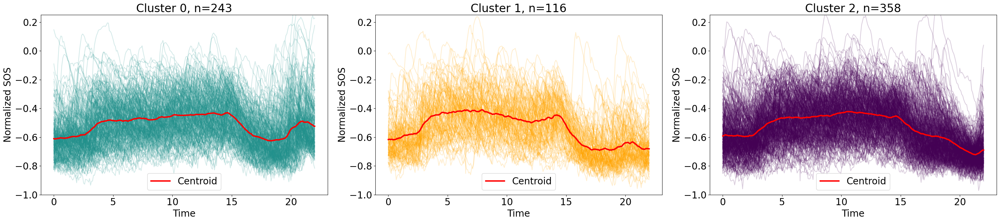

In [ ]:
#plot series_gluaa_cip_survivors based on clusters_gluaa
k=0
times = np.linspace(0, 22,264)
fig, ax = plt.subplots(1, 3, figsize=(30, 7))
for c in range(3):
    for i,s in enumerate(series_gluaa_cip_survivors):
        if clusters_gluaa[i]==c:
            ax[c].plot(times, s[:,1].T, color=colordict[c], alpha=0.2)
            k+=1
    ax[c].set_title(f'Cluster {c}, n={np.sum(clusters_gluaa==c)}')
    ax[c].set_xlabel('Time')
    ax[c].set_ylabel('Normalized SOS')
    ax[c].set_ylim(-1,0.25)
plt.tight_layout()
# # add cluster centroids to the plots
for c in range(3):
    cluster_series = [series_gluaa_cip_survivors[i][:,1] for i in range(len(series_gluaa_cip_survivors)) if clusters_gluaa[i]==c]
    centroid = np.mean(cluster_series, axis=0)
    ax[c].plot(times, centroid, color='red', linewidth=3, label='Centroid')
    ax[c].legend()

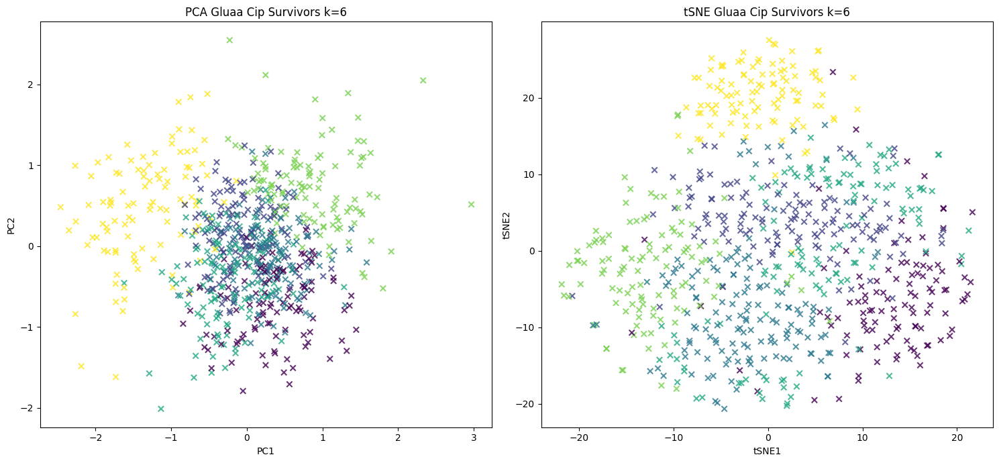

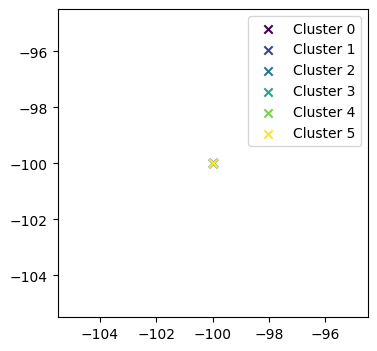

In [13]:
# gluaa 6 clusters
kmeans_gluaa = KMeans(n_clusters=6, random_state=42)
clusters_gluaa = kmeans_gluaa.fit_predict(latent_gluaa_cip_survivors)
# pca and tsne
z_run_pca_gluaa = PCA(n_components=2).fit_transform(latent_gluaa_cip_survivors)
z_run_tsne_gluaa = TSNE(perplexity=37, min_grad_norm=1E-12, n_iter=3000, learning_rate='auto', init='random').fit_transform(latent_gluaa_cip_survivors)

#6 colors from viridis colormap
cmapvir = plt.get_cmap('viridis')

colors=[cmapvir(i) for i in np.linspace(0, 1, 6)]
hexcolors = [colors[i] for i in clusters_gluaa]

fig, ax = plt.subplots(1, 2, figsize=(15, 7))
ax[0].scatter(z_run_pca_gluaa[:, 0], z_run_pca_gluaa[:, 1], c=hexcolors, marker='x', alpha=0.8)
ax[0].set_title('PCA Gluaa Cip Survivors k=6')
ax[0].set_xlabel('PC1')
ax[0].set_ylabel('PC2')
ax[1].scatter(z_run_tsne_gluaa[:, 0], z_run_tsne_gluaa[:, 1], c=hexcolors, marker='x', alpha=0.8)
ax[1].set_title('tSNE Gluaa Cip Survivors k=6')
ax[1].set_xlabel('tSNE1')
ax[1].set_ylabel('tSNE2')
plt.tight_layout()
plt.figure(figsize=(4,4))
for i in range(6):
    plt.scatter(-100,-100, color=colors[i], label=f'Cluster {i}', marker='x')
plt.legend()

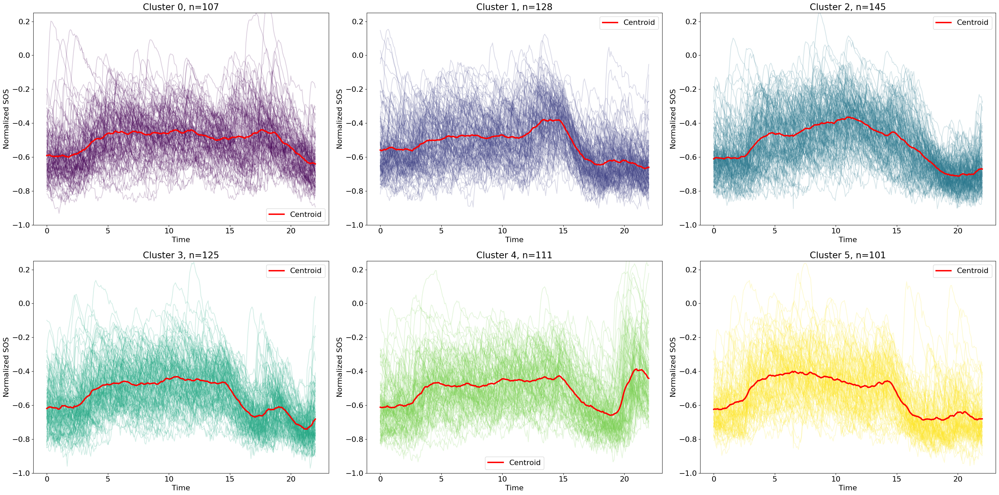

In [15]:
plt.rcParams.update({'font.size': 16})
times = np.linspace(0, 22,264)
fig, ax = plt.subplots(2, 3, figsize=(30, 15))
axes = ax.flatten()
for c in range(6):
    for i,s in enumerate(series_gluaa_cip_survivors):
        if clusters_gluaa[i]==c:
            axes[c].plot(times, s[:,1].T, color=colors[c], alpha=0.2)
    axes[c].set_title(f'Cluster {c}, n={np.sum(clusters_gluaa==c)}')
    axes[c].set_xlabel('Time')
    axes[c].set_ylabel('Normalized SOS')
    axes[c].set_ylim(-1,0.25)
plt.tight_layout()
# # add cluster centroids to the plots
for c in range(6):
    cluster_series = [series_gluaa_cip_survivors[i][:,1] for i in range(len(series_gluaa_cip_survivors)) if clusters_gluaa[i]==c]
    centroid = np.mean(cluster_series, axis=0)
    axes[c].plot(times, centroid, color='red', linewidth=3, label='Centroid')
    axes[c].legend()

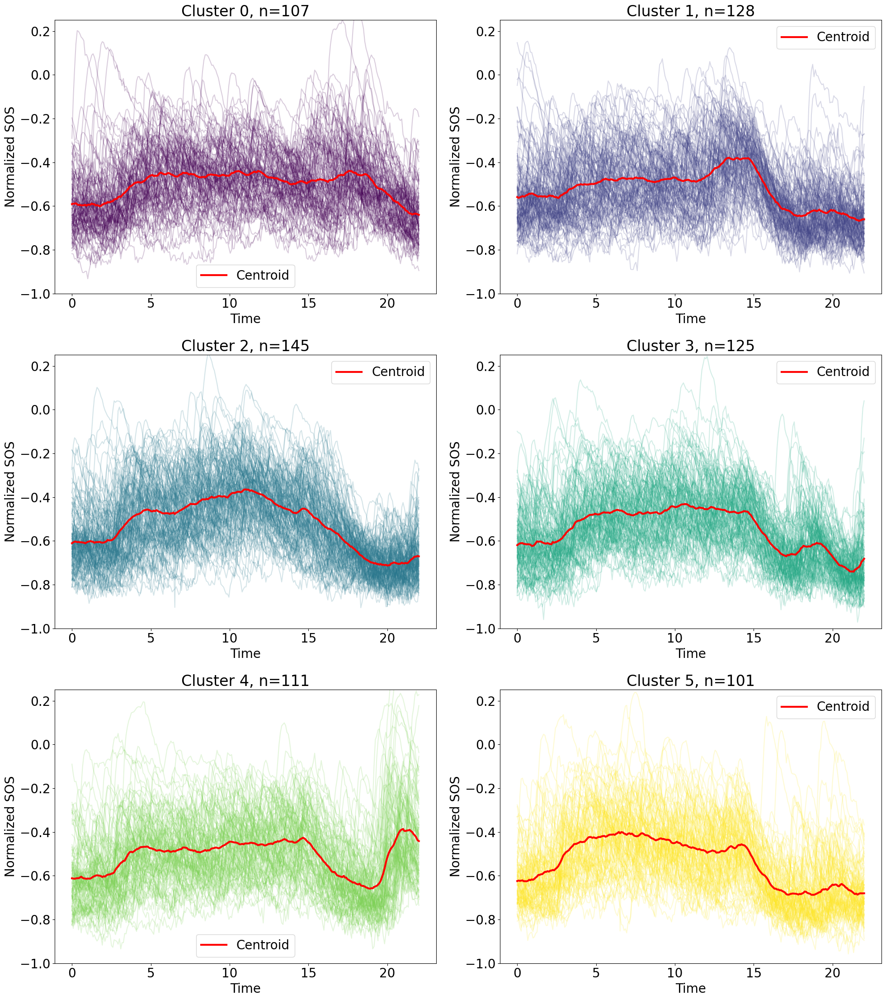

In [ ]:
# vertical subplot
plt.rcParams.update({'font.size': 20})
times = np.linspace(0, 22,264)
fig, ax = plt.subplots(3, 2, figsize=(20, 22.5))
axes = ax.flatten()
for c in range(6):
    for i,s in enumerate(series_gluaa_cip_survivors):
        if clusters_gluaa[i]==c:
            axes[c].plot(times, s[:,1].T, color=colors[c], alpha=0.2)
    axes[c].set_title(f'Cluster {c}, n={np.sum(clusters_gluaa==c)}')
    axes[c].set_xlabel('Time')
    axes[c].set_ylabel('Normalized SOS')
    axes[c].set_ylim(-1,0.25)
plt.tight_layout()
# # add cluster centroids to the plots
for c in range(6):
    cluster_series = [series_gluaa_cip_survivors[i][:,1] for i in range(len(series_gluaa_cip_survivors)) if clusters_gluaa[i]==c]
    centroid = np.mean(cluster_series, axis=0)
    axes[c].plot(times, centroid, color='red', linewidth=3, label='Centroid')
    axes[c].legend()

Adjusted Rand Index between KMeans clusters and experiment labels:	 0.026580635642794972


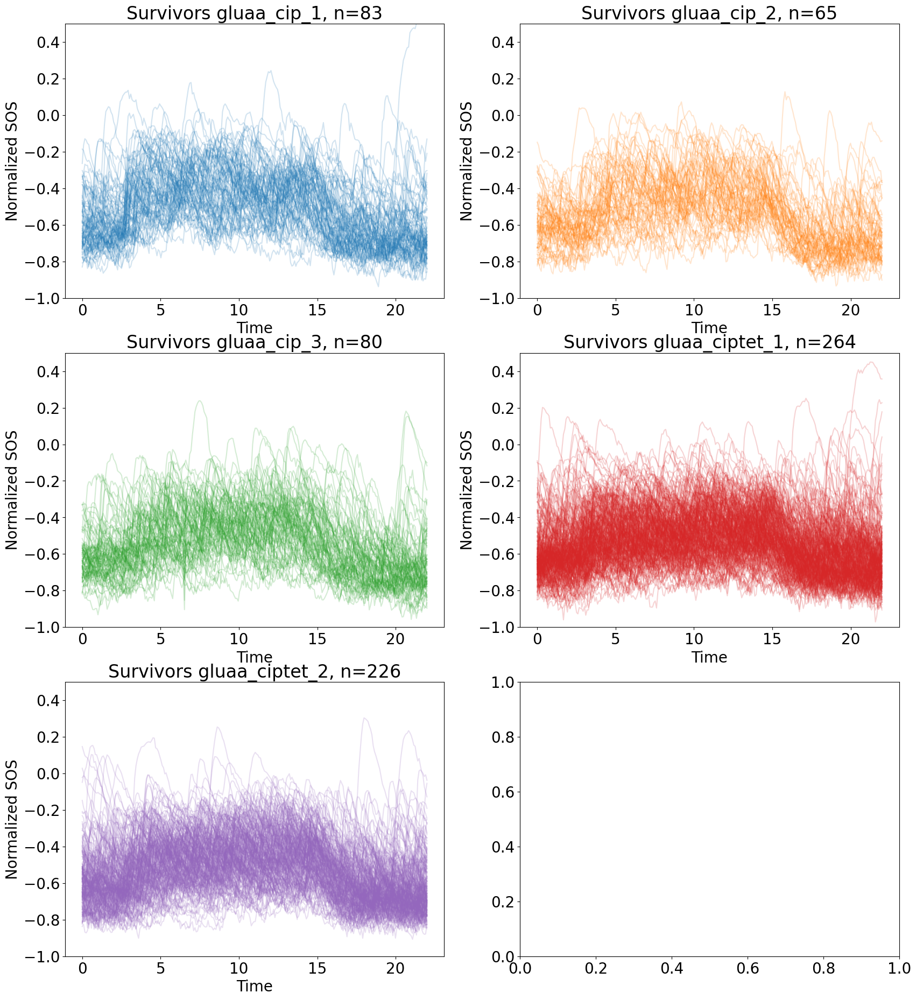

In [ ]:
experiment_counts = {'gluaa_cip_1': 83, 'gluaa_cip_2': 65, 'gluaa_cip_3': 80, 'gluaa_ciptet_1': 264, 'gluaa_ciptet_2': 226}

# #lets plot sos series and color by experiment
cmaptab = plt.get_cmap('tab10')
exp_colors = {exp: cmaptab(i) for i, exp in enumerate(experiment_counts.keys())}
fig, ax = plt.subplots(3, 2, figsize=(20, 22.5))
axes = ax.flatten()
for a,exp in enumerate(experiment_counts.keys()):
    exp_series = np.array([series_gluaa_cip_survivors[i][:,1] for i,y in enumerate(y_gluaa_cip_survivors) if (f'{y[0]}_{y[1]}_{y[2]}'==exp)])
    for s in exp_series:
        axes[a].plot(times, s.T, color=exp_colors[exp], alpha=0.2)
    axes[a].set_title(f'Survivors {exp}, n={experiment_counts[exp]}')
    axes[a].set_xlabel('Time')
    axes[a].set_ylabel('Normalized SOS')
    axes[a].set_ylim(-1,0.5)

experiment_labels = {'gluaa_cip_1': 0, 'gluaa_cip_2': 1, 'gluaa_cip_3': 2, 'gluaa_ciptet_1': 3, 'gluaa_ciptet_2': 4}
series_exp_label = [experiment_labels[f'{y[0]}_{y[1]}_{y[2]}'] for y in y_gluaa_cip_survivors]
# adjusted rand index between clusters_gluaa and series_exp_label
from sklearn.metrics import adjusted_rand_score
ari = adjusted_rand_score(clusters_gluaa, series_exp_label)
print('Adjusted Rand Index between KMeans clusters and experiment labels:\t',ari)

In [24]:
len(series_exp_label)
len(clusters_gluaa)

717